
# <center><font style="color:rgb(100,109,254)">Human Action Recognition (HAR)
</font> </center>

<center>
<img src=''></center>

 <h2>Project Developers:</h2>
  <ul>
      <li>Swapnil Patil</li>
      <li>Devyani Ushir</li>
  </ul>



In [ ]:
# Discard the output of this cell.
%%capture

# Install the required libraries.
!pip install pafy youtube-dl moviepy
!pip install git+https://github.com/TahaAnwar/pafy.git#egg=pafy
!pip install -q moviepy
!apt install imagemagick
!pip install imageio==2.4.1
!pip install pyswarm
!pip install pytube


In [ ]:
# Import the required libraries.
import os
import cv2
import pafy
import math
import random
import pytube
import numpy as np
import datetime as dt
import tensorflow as tf
import seaborn as sn
from pytube import YouTube
from collections import deque
import matplotlib.pyplot as plt
import mlxtend
from mlxtend.plotting import plot_confusion_matrix
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report

from moviepy.editor import *
%matplotlib inline

from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import *
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import plot_model
import datetime as dt
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import ConvLSTM2D, MaxPooling3D, TimeDistributed, Dropout, Flatten, Dense
from keras.callbacks import EarlyStopping
from keras.utils import plot_model
from keras.models import load_model
import numpy as np
import pyswarm as ps


In [ ]:
seed_constant = 27
np.random.seed(seed_constant)
random.seed(seed_constant)
tf.random.set_seed(seed_constant)


In [ ]:
# Discard the output of this cell.
%%capture

# Downlaod the UCF50 Dataset
!wget --no-check-certificate https://www.crcv.ucf.edu/data/UCF50.rar

#Extract the Dataset
!unrar x UCF50.rar


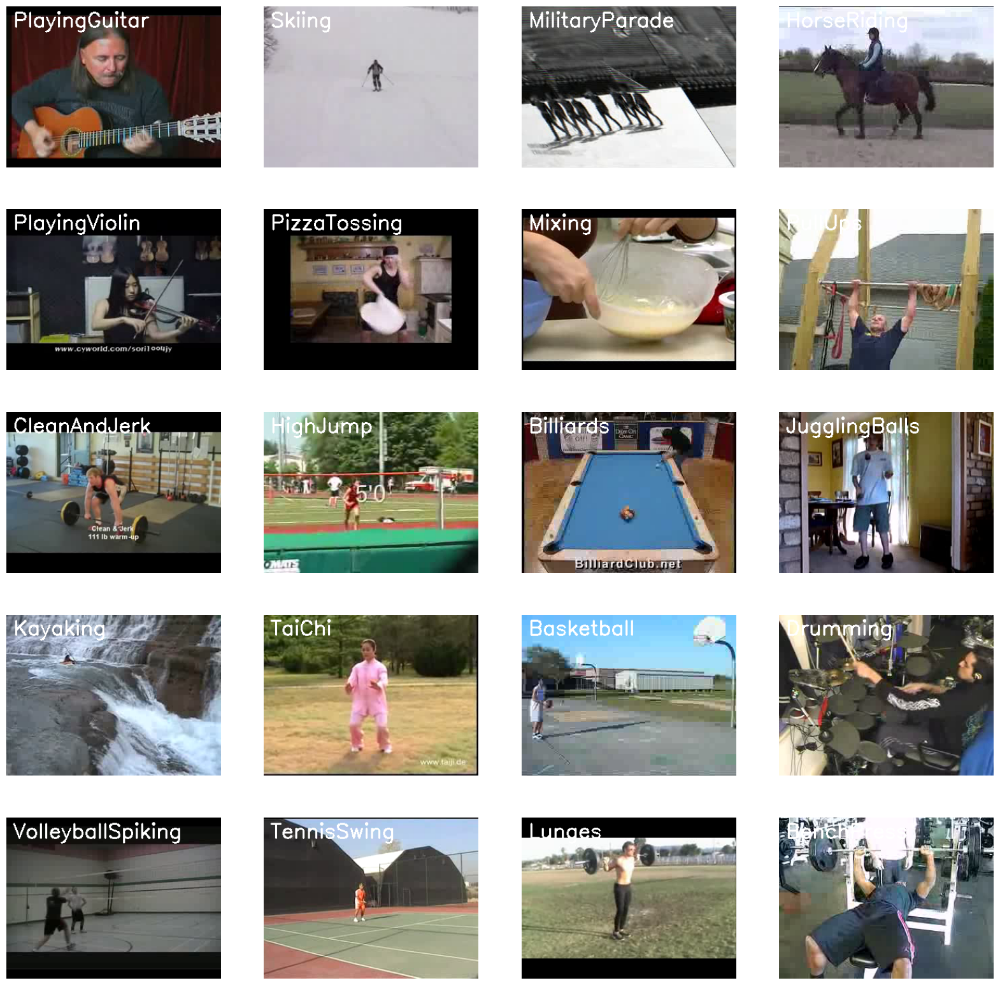

In [ ]:
# Create a Matplotlib figure and specify the size of the figure.
plt.figure(figsize = (20, 20))

# Get the names of all classes/categories in UCF50.
all_classes_names = os.listdir('UCF50')

# Generate a list of 20 random values. The values will be between 0-50,
# where 50 is the total number of class in the dataset.
random_range = random.sample(range(len(all_classes_names)), 20)

# Iterating through all the generated random values.
for counter, random_index in enumerate(random_range, 1):

    # Retrieve a Class Name using the Random Index.
    selected_class_Name = all_classes_names[random_index]

    # Retrieve the list of all the video files present in the randomly selected Class Directory.
    video_files_names_list = os.listdir(f'UCF50/{selected_class_Name}')

    # Randomly select a video file from the list retrieved from the randomly selected Class Directory.
    selected_video_file_name = random.choice(video_files_names_list)

    # Initialize a VideoCapture object to read from the video File.
    video_reader = cv2.VideoCapture(f'UCF50/{selected_class_Name}/{selected_video_file_name}')

    # Read the first frame of the video file.
    _, bgr_frame = video_reader.read()

    # Release the VideoCapture object.
    video_reader.release()

    # Convert the frame from BGR into RGB format.
    rgb_frame = cv2.cvtColor(bgr_frame, cv2.COLOR_BGR2RGB)

    # Write the class name on the video frame.
    cv2.putText(rgb_frame, selected_class_Name, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)

    # Display the frame.
    plt.subplot(5, 4, counter);plt.imshow(rgb_frame);plt.axis('off')



In [ ]:
# Define PSO hyperparameters
num_particles = 10
num_dimensions = 3
num_iterations = 5
min_error = 1e-5
bounds = [(1, 32), (1, 5), (0.1, 0.5)]  # bounds for filters, kernel size, and dropout rate

inertia_weight = 0.7
c1 = 1.5  # Cognitive weight
c2 = 1.5  # Social weight


In [ ]:
def pso_optimize(fitness_function, num_particles, num_dimensions, num_iterations, bounds, min_error, inertia_weight, c1, c2):
    # Initialize particles with random positions within bounds
    particles = np.random.uniform(low=np.array([bound[0] for bound in bounds]),
                                  high=np.array([bound[1] for bound in bounds]),
                                  size=(num_particles, num_dimensions))

    # Initialize particle velocities
    velocities = np.random.uniform(low=0, high=0, size=(num_particles, num_dimensions))

    # Initialize personal best positions and fitness
    personal_best_positions = np.copy(particles)
    personal_best_fitness = np.array([fitness_function(p) for p in particles])

    # Initialize global best position and fitness
    global_best_position = personal_best_positions[np.argmin(personal_best_fitness)]
    global_best_fitness = np.min(personal_best_fitness)

    print("Start Iteration")
    for iteration in range(num_iterations):
        # Update velocities
        r1 = np.random.uniform(0, 1, (num_particles, num_dimensions))
        r2 = np.random.uniform(0, 1, (num_particles, num_dimensions))

        # Calculate cognitive and social components for all particles and dimensions
        cognitive_components = c1 * r1 * (personal_best_positions - particles)
        social_components = c2 * r2 * (global_best_position - particles)

        velocities = inertia_weight * velocities + cognitive_components + social_components

        # Update particle positions
        particles += velocities

        # Evaluate fitness of each particle
        fitness = np.array([fitness_function(p) for p in particles])

        # Update personal best positions and fitness
        improved_indices = np.where(fitness < personal_best_fitness)
        personal_best_positions[improved_indices] = particles[improved_indices]
        personal_best_fitness[improved_indices] = fitness[improved_indices]

        # Update global best if a better position is found
        if np.min(fitness) < global_best_fitness:
            global_best_position = particles[np.argmin(fitness)]
            global_best_fitness = np.min(fitness)

        # Print particle positions after each iteration (optional)
        print(f'Iteration {iteration + 1}: Particle Positions:')
        for i, particle_position in enumerate(particles):
            print(f'Particle {i + 1}: {particle_position}')

    # Return the best solution found by the PSO algorithm
    return global_best_position, global_best_fitness


In [ ]:
def fitness_function(hyperparameters):
    filters, kernel_size_value, dropout_rate = int(hyperparameters[0]), (int(hyperparameters[1]),int(hyperparameters[1])), hyperparameters[2]
    convlstm_model = create_convlstm_model(filters, kernel_size_value, dropout_rate)
    convlstm_model.compile(loss='categorical_crossentropy', optimizer='Adam', metrics=['accuracy'])
    convlstm_model.fit(x=features_train, y=labels_train, epochs=20, batch_size=4, shuffle=True, validation_split=0.2, verbose=0)
    _, accuracy = convlstm_model.evaluate(features_test, labels_test)
    return 1 / accuracy  # We want to minimize the inverse of accuracy


In [ ]:
 # Specify the height and width to which each video frame will be resized in our dataset.
IMAGE_HEIGHT , IMAGE_WIDTH = 64, 64

# Specify the number of frames of a video that will be fed to the model as one sequence.
SEQUENCE_LENGTH = 20

# Specify the directory containing the UCF50 dataset.
DATASET_DIR = "UCF50"

# Specify the list containing the names of the classes used for training. Feel free to choose any set of classes.
CLASSES_LIST =  ["WalkingWithDog", "TaiChi", "Swing", "HorseRace"]


In [ ]:
def frames_extraction(video_path):
    '''
    This function will extract the required frames from a video after resizing and normalizing them.
    Args:
        video_path: The path of the video in the disk, whose frames are to be extracted.
    Returns:
        frames_list: A list containing the resized and normalized frames of the video.
    '''

    # Declare a list to store video frames.
    frames_list = []

    # Read the Video File using the VideoCapture object.
    video_reader = cv2.VideoCapture(video_path)

    # Get the total number of frames in the video.
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))

    # Calculate the the interval after which frames will be added to the list.
    skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH), 1)

    # Iterate through the Video Frames.
    for frame_counter in range(SEQUENCE_LENGTH):

        # Set the current frame position of the video.
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)

        # Reading the frame from the video.
        success, frame = video_reader.read()

        # Check if Video frame is not successfully read then break the loop
        if not success:
            break

        # Resize the Frame to fixed height and width.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))

        # Normalize the resized frame by dividing it with 255 so that each pixel value then lies between 0 and 1
        normalized_frame = resized_frame / 255

        # Append the normalized frame into the frames list
        frames_list.append(normalized_frame)

    # Release the VideoCapture object.
    video_reader.release()

    # Return the frames list.
    return frames_list


In [ ]:
def create_dataset():
    '''
    This function will extract the data of the selected classes and create the required dataset.
    Returns:
        features:          A list containing the extracted frames of the videos.
        labels:            A list containing the indexes of the classes associated with the videos.
        video_files_paths: A list containing the paths of the videos in the disk.
    '''

    # Declared Empty Lists to store the features, labels and video file path values.
    features = []
    labels = []
    video_files_paths = []

    # Iterating through all the classes mentioned in the classes list
    for class_index, class_name in enumerate(CLASSES_LIST):

        # Display the name of the class whose data is being extracted.
        print(f'Extracting Data of Class: {class_name}')

        # Get the list of video files present in the specific class name directory.
        files_list = os.listdir(os.path.join(DATASET_DIR, class_name))

        # Iterate through all the files present in the files list.
        for file_name in files_list:

            # Get the complete video path.
            video_file_path = os.path.join(DATASET_DIR, class_name, file_name)

            # Extract the frames of the video file.
            frames = frames_extraction(video_file_path)

            # Check if the extracted frames are equal to the SEQUENCE_LENGTH specified above.
            # So ignore the vides having frames less than the SEQUENCE_LENGTH.
            if len(frames) == SEQUENCE_LENGTH:

                # Append the data to their repective lists.
                features.append(frames)
                labels.append(class_index)
                video_files_paths.append(video_file_path)

    # Converting the list to numpy arrays
    features = np.asarray(features)
    labels = np.array(labels)

    # Return the frames, class index, and video file path.
    return features, labels, video_files_paths


In [ ]:
# Create the dataset
features, labels, video_files_paths = create_dataset()


Extracting Data of Class: WalkingWithDog
Extracting Data of Class: TaiChi
Extracting Data of Class: Swing
Extracting Data of Class: HorseRace


In [ ]:
# Using Keras's to_categorical method to convert labels into one-hot-encoded vectors
one_hot_encoded_labels = to_categorical(labels)


In [ ]:
# Split the Data into Train (75%) and Test Set (25%)
features_train, features_test, labels_train, labels_test = train_test_split(features, one_hot_encoded_labels,
                                                                            test_size=0.25, shuffle=True,
                                                                            random_state=seed_constant)


In [ ]:
def create_convlstm_model(filters, kernel_size, dropout_rate):
    '''
    This function will construct the required convlstm model.
    Returns:
        model: It is the required constructed convlstm model.
    '''

    # We will use a Sequential model for model construction
    model = Sequential()

    # Define the Model Architecture.
    ########################################################################################################################

    model.add(ConvLSTM2D(filters = filters, kernel_size = kernel_size, activation = 'tanh',data_format = "channels_last",
                         recurrent_dropout=dropout_rate, return_sequences=True, input_shape = (SEQUENCE_LENGTH,
                                                                                      IMAGE_HEIGHT, IMAGE_WIDTH, 3)))

    model.add(MaxPooling3D(pool_size=(2, 2, 2), padding='same', data_format='channels_last'))
    model.add(TimeDistributed(Dropout(0.2)))

    model.add(ConvLSTM2D(filters = filters, kernel_size = kernel_size, activation = 'tanh', data_format = "channels_last",
                         recurrent_dropout=dropout_rate, return_sequences=True))

    model.add(MaxPooling3D(pool_size=(2, 2, 2), padding='same', data_format='channels_last'))
    model.add(TimeDistributed(Dropout(0.2)))

    model.add(ConvLSTM2D(filters = filters, kernel_size = kernel_size, activation = 'tanh', data_format = "channels_last",
                         recurrent_dropout=dropout_rate, return_sequences=True))

    model.add(MaxPooling3D(pool_size=(2, 2, 2), padding='same', data_format='channels_last'))
    model.add(TimeDistributed(Dropout(0.2)))

    model.add(ConvLSTM2D(filters = filters, kernel_size = kernel_size, activation = 'tanh', data_format = "channels_last",
                         recurrent_dropout=dropout_rate, return_sequences=True))

    model.add(MaxPooling3D(pool_size=(2, 2, 2), padding='same', data_format='channels_last'))
    #model.add(TimeDistributed(Dropout(0.2)))



    model.add(Flatten())

    model.add(Dense(len(CLASSES_LIST), activation = "softmax"))

    ########################################################################################################################

    # Display the models summary.
    model.summary()

    # Return the constructed convlstm model.
    return model


In [ ]:
# Perform the PSO optimization and get the best hyperparameters
best_hyperparameters = pso_optimize(fitness_function, num_particles, num_dimensions, num_iterations, bounds, min_error,inertia_weight,c1,c2)
print("Best Hyperparameters:", best_hyperparameters)


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_4 (ConvLSTM2D)  (None, 20, 61, 61, 14)    15288     
                                                                 
 max_pooling3d_4 (MaxPoolin  (None, 10, 31, 31, 14)    0         
 g3D)                                                            
                                                                 
 time_distributed_3 (TimeDi  (None, 10, 31, 31, 14)    0         
 stributed)                                                      
                                                                 
 conv_lstm2d_5 (ConvLSTM2D)  (None, 10, 28, 28, 14)    25144     
                                                                 
 max_pooling3d_5 (MaxPoolin  (None, 5, 14, 14, 14)     0         
 g3D)                                                            
                                                      

In [ ]:
# Use the best hyperparameters to create the  ConvLSTM model
best_convlstm_model = create_convlstm_model(filters=int(best_hyperparameters[0][0]),
                                            kernel_size=(int(best_hyperparameters[0][1]), int(best_hyperparameters[0][1])),
                                            dropout_rate=best_hyperparameters[0][2])
# Display the success message.
print("Model Created Successfully!")


Model: "sequential_64"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_256 (ConvLSTM2  (None, 20, 62, 62, 27)    29268     
 D)                                                              
                                                                 
 max_pooling3d_256 (MaxPool  (None, 10, 31, 31, 27)    0         
 ing3D)                                                          
                                                                 
 time_distributed_192 (Time  (None, 10, 31, 31, 27)    0         
 Distributed)                                                    
                                                                 
 conv_lstm2d_257 (ConvLSTM2  (None, 10, 29, 29, 27)    52596     
 D)                                                              
                                                                 
 max_pooling3d_257 (MaxPool  (None, 5, 15, 15, 27)   

In [ ]:
# Create an instance of Early Stopping Callback
early_stopping_callback = EarlyStopping(monitor='val_loss', patience=10, mode='min', restore_best_weights=True)

# Compile the model and specify loss function     , optimizer, and metrics values
best_convlstm_model.compile(loss='categorical_crossentropy', optimizer='Adam', metrics=['accuracy'])

# Start training the model.
convlstm_model_training_history = best_convlstm_model.fit(x=features_train, y=labels_train,
                                                        epochs=50, batch_size=4,
                                                        shuffle=True, validation_split=0.2,
                                                        callbacks=[early_stopping_callback])


Epoch 1/50
73/73 [==============================] - 21s 169ms/step - loss: 1.3884 - accuracy: 0.2363 - val_loss: 1.3844 - val_accuracy: 0.1781
Epoch 2/50
73/73 [==============================] - 11s 153ms/step - loss: 1.3752 - accuracy: 0.3664 - val_loss: 1.4300 - val_accuracy: 0.1781
Epoch 3/50
73/73 [==============================] - 11s 152ms/step - loss: 1.3249 - accuracy: 0.3973 - val_loss: 1.2584 - val_accuracy: 0.4932
Epoch 4/50
73/73 [==============================] - 11s 153ms/step - loss: 1.1961 - accuracy: 0.5308 - val_loss: 1.2643 - val_accuracy: 0.4795
Epoch 5/50
73/73 [==============================] - 10s 143ms/step - loss: 1.0831 - accuracy: 0.5685 - val_loss: 1.0711 - val_accuracy: 0.5205
Epoch 6/50
73/73 [==============================] - 11s 156ms/step - loss: 1.0523 - accuracy: 0.5959 - val_loss: 1.0681 - val_accuracy: 0.5342
Epoch 7/50
73/73 [==============================] - 13s 182ms/step - loss: 0.8792 - accuracy: 0.6370 - val_loss: 0.9379 - val_accuracy: 0.5890

**<font style="color:rgb(134,19,348)">Evaluate the Trained Model</font>**

After training, we will evaluate the model on the test set.

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

# Load the Keras model from Google Drive
from keras.models import load_model
best_convlstm_model = load_model('/content/gdrive/MyDrive/Colab Notebooks/myModel/best_convlstm_model.h5')


Mounted at /content/gdrive


In [ ]:
# Evaluate the trained model
model_evaluation_history = best_convlstm_model.evaluate(features_test, labels_test)


4/4 [==============================] - 9s 237ms/step - loss: 0.2580 - accuracy: 0.9098


In [ ]:
# Evaluate the model
test_loss, test_accuracy = best_convlstm_model.evaluate(features_test, labels_test)
print(f'Test Accuracy: {test_accuracy * 100:.2f}%')


4/4 [==============================] - 1s 162ms/step - loss: 0.2580 - accuracy: 0.9098
Test Accuracy: 90.98%


In [ ]:
# Save the trained model
best_convlstm_model.save('/content/best_convlstm_model.h5')


In [ ]:
# Get the loss and accuracy from model_evaluation_history.
model_evaluation_loss, model_evaluation_accuracy = model_evaluation_history

# Define the string date format.
# Get the current Date and Time in a DateTime Object.
# Convert the DateTime object to string according to the style mentioned in date_time_format string.
date_time_format = '%Y_%m_%d__%H_%M_%S'
current_date_time_dt = dt.datetime.now()
current_date_time_string = dt.datetime.strftime(current_date_time_dt, date_time_format)

# Define a useful name for our model to make it easy for us while navigating through multiple saved models.
model_file_name = f'convlstm_model___Date_Time_{current_date_time_string}___Loss_{model_evaluation_loss}___Accuracy_{model_evaluation_accuracy}.h5'

# Save your Model.
best_convlstm_model.save('/content/83/'+model_file_name)


In [ ]:
# Plot the accuracy during training
def plot_metric(model_training_history, metric_name_1, metric_name_2, plot_name):
    '''
    This function will plot the metrics passed to it in a graph.
    Args:
        model_training_history: A history object containing a record of training and validation
                                loss values and metrics values at successive epochs
        metric_name_1:          The name of the first metric that needs to be plotted in the graph.
        metric_name_2:          The name of the second metric that needs to be plotted in the graph.
        plot_name:              The title of the graph.
    '''

    # Get metric values using metric names as identifiers.
    metric_value_1 = model_training_history.history[metric_name_1]
    metric_value_2 = model_training_history.history[metric_name_2]

    # Construct a range object which will be used as x-axis (horizontal plane) of the graph.
    epochs = range(len(metric_value_1))

    # Plot the Graph.
    plt.plot(epochs, metric_value_1, 'blue', label=metric_name_1)
    plt.plot(epochs, metric_value_2, 'red', label=metric_name_2)

    # Add title to the plot.
    plt.title(str(plot_name))

    # Add legend to the plot.
    plt.legend()


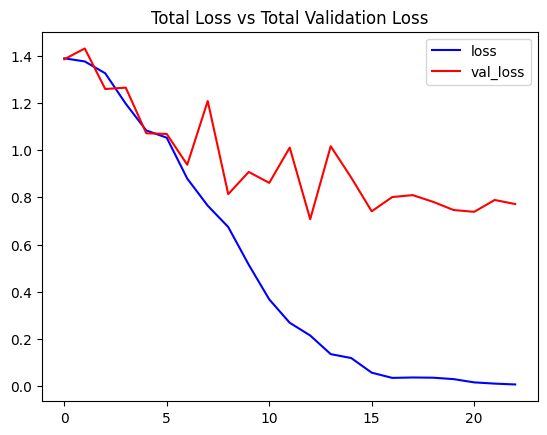

In [ ]:
# Visualize the training and validation loss metrices.
plot_metric(convlstm_model_training_history, 'loss', 'val_loss', 'Total Loss vs Total Validation Loss')


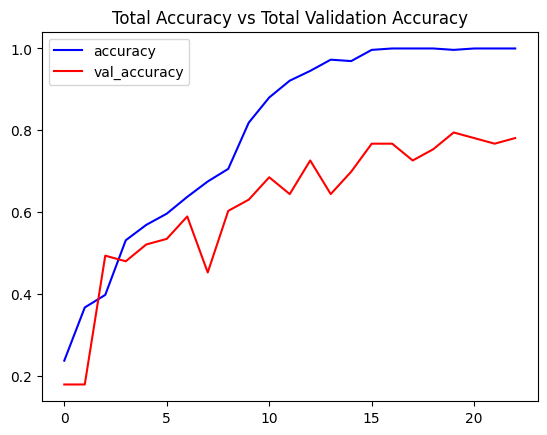

In [ ]:
# Visualize the training and validation accuracy metrices.
plot_metric(convlstm_model_training_history, 'accuracy', 'val_accuracy', 'Total Accuracy vs Total Validation Accuracy')


**<font style="color:rgb(134,19,348)">Confusion Matrix Visualize</font>**

In [ ]:
# Evaluate the confusion_marix.
best_convlstm_model.predict(np.expand_dims(features_test[0], axis=0)).round(2)


1/1 [==============================] - 2s 2s/step


array([[0.43, 0.02, 0.51, 0.04]], dtype=float32)

In [ ]:
y_test=np.argmax(labels_test,axis=-1)


In [ ]:
labels_test[0]


array([1., 0., 0., 0.], dtype=float32)

In [ ]:
# predict the features_test data
y_pred = np.argmax(best_convlstm_model.predict(features_test),axis=1)
y_pred


4/4 [==============================] - 1s 157ms/step


array([2, 3, 3, 3, 2, 3, 2, 0, 0, 3, 3, 3, 1, 1, 2, 0, 0, 2, 3, 1, 3, 2,
       2, 2, 2, 2, 3, 1, 2, 0, 2, 3, 2, 1, 2, 1, 0, 3, 1, 1, 2, 2, 3, 1,
       2, 0, 2, 2, 0, 0, 0, 0, 1, 3, 3, 1, 1, 0, 1, 2, 3, 3, 0, 3, 2, 0,
       1, 1, 2, 3, 3, 3, 1, 1, 2, 1, 2, 1, 3, 2, 3, 2, 1, 1, 0, 1, 0, 3,
       0, 3, 1, 3, 3, 1, 3, 0, 3, 1, 3, 0, 1, 0, 2, 1, 2, 3, 0, 3, 0, 1,
       3, 0, 3, 0, 3, 2, 3, 2, 1, 3, 2, 2])

In [ ]:
# Display the Acuuracy
print('Accuracy score :', accuracy_score(y_test, y_pred))


Accuracy score : 0.9098360655737705


In [ ]:
# Plot the confusion_matrix of convlstm.
plt.figure(figsize=(16,9))
y_pred_labels = [np.argmax(label) for label in y_pred ]
print('Confusion Matrix')
cm = confusion_matrix(y_test, y_pred)


Confusion Matrix


<Figure size 1600x900 with 0 Axes>

Text(0.5, 58.7222222222222, 'Predicted Labels')

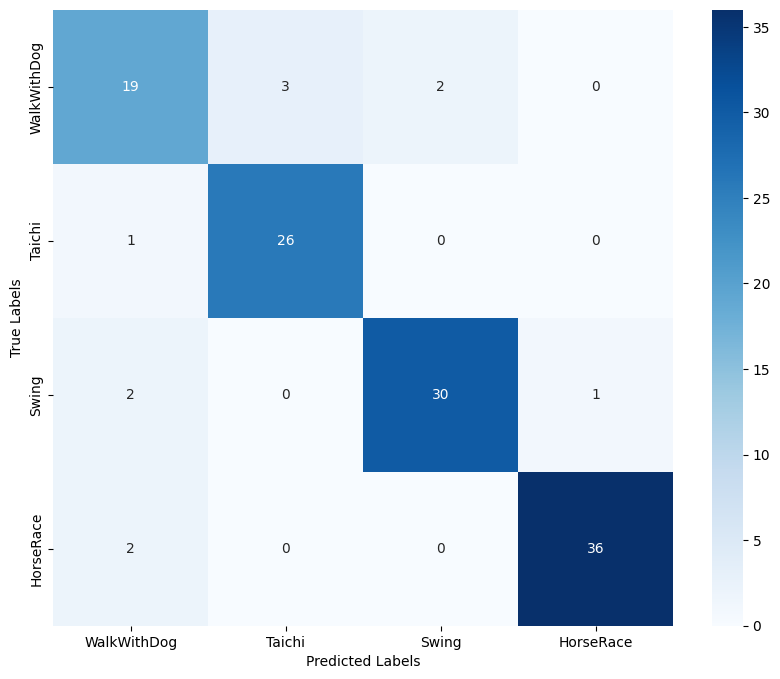

In [ ]:
# Visualize the confusion_matrix of convlstm.
plt.figure(figsize=(10,8))
x_axis_labels = ['WalkWithDog', 'Taichi', 'Swing', 'HorseRace']
y_axis_labels = ['WalkWithDog', 'Taichi', 'Swing', 'HorseRace' ]
sn.heatmap(data = cm, annot = True, cmap = 'Blues', xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.ylabel('True Labels')
plt.xlabel('Predicted Labels')


In [ ]:
label_names = ['WalkWithDog', 'Taichi', 'Swing', 'HorseRace']
print(classification_report(y_test, y_pred,target_names=label_names))


              precision    recall  f1-score   support

 WalkWithDog       0.79      0.79      0.79        24
      Taichi       0.90      0.96      0.93        27
       Swing       0.94      0.91      0.92        33
   HorseRace       0.97      0.95      0.96        38

    accuracy                           0.91       122
   macro avg       0.90      0.90      0.90       122
weighted avg       0.91      0.91      0.91       122



# OUTPUT

In [ ]:
def download_youtube_video(youtube_video_url, output_directory):
     '''
    This function downloads the youtube video whose URL is passed to it as an argument.
    Args:
        youtube_video_url: URL of the video that is required to be downloaded.
        output_directory:  The directory path to which the video needs to be stored after downloading.
    Returns:
        title: The title of the downloaded youtube video.
    '''
     try:
        yt = YouTube(youtube_video_url)
        video_stream = yt.streams.filter(progressive=True, file_extension='mp4').order_by('resolution').desc().first()
        video_stream.download(output_path=output_directory)
        print(f"Video '{yt.title}' downloaded successfully.")
        return yt.title
     except Exception as e:
        print(f"An error occurred: {str(e)}")
        return None


In [ ]:
def predict_single_action(video_file_path, SEQUENCE_LENGTH):
    '''
    This function will perform single action recognition prediction on a video using the LRCN model.
    Args:
    video_file_path:  The path of the video stored in the disk on which the action recognition is to be performed.
    SEQUENCE_LENGTH:  The fixed number of frames of a video that can be passed to the model as one sequence.
    '''

    # Initialize the VideoCapture object to read from the video file.
    video_reader = cv2.VideoCapture(video_file_path)

    # Get the width and height of the video.
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))

    # Declare a list to store video frames we will extract.
    frames_list = []

    # Initialize a variable to store the predicted action being performed in the video.
    predicted_class_name = ''

    # Get the number of frames in the video.
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))

    # Calculate the interval after which frames will be added to the list.
    skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH),1)

    # Iterating the number of times equal to the fixed length of sequence.
    for frame_counter in range(SEQUENCE_LENGTH):

        # Set the current frame position of the video.
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)

        # Read a frame.
        success, frame = video_reader.read()

        # Check if frame is not read properly then break the loop.
        if not success:
            break

        # Resize the Frame to fixed Dimensions.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))

        # Normalize the resized frame by dividing it with 255 so that each pixel value then lies between 0 and 1.
        normalized_frame = resized_frame / 255

        # Appending the pre-processed frame into the frames list
        frames_list.append(normalized_frame)

    # Passing the  pre-processed frames to the model and get the predicted probabilities.
    predicted_labels_probabilities = best_convlstm_model.predict(np.expand_dims(frames_list, axis = 0))[0]

    # Get the index of class with highest probability.
    predicted_label = np.argmax(predicted_labels_probabilities)

    # Get the class name using the retrieved index.
    predicted_class_name = CLASSES_LIST[predicted_label]

    # Display the predicted action along with the prediction confidence.
    print(f'Action Predicted: {predicted_class_name}\nConfidence: {predicted_labels_probabilities[predicted_label]}')

    # Release the VideoCapture object.
    video_reader.release()


In [ ]:
# Make the Output directory if it does not exist
test_videos_directory = 'test_videos'
os.makedirs(test_videos_directory, exist_ok=True)

# Download the youtube video.
video_title = download_youtube_video('https://www.youtube.com/watch?v=ceRjxW4MpOY', test_videos_directory)

# Get the YouTube Video's path we just downloaded.
if video_title:
    input_video_file_path = os.path.join(test_videos_directory, f'{video_title}.mp4')


Video 'Tai Chi' downloaded successfully.


In [ ]:
# Construct tihe nput youtube video path
input_video_file_path = f'{test_videos_directory}/{video_title}.mp4'

# Perform Single Prediction on the Test Video.
predict_single_action(input_video_file_path, SEQUENCE_LENGTH)

# Display the input video.
VideoFileClip(input_video_file_path, audio=False, target_resolution=(300,None)).ipython_display()


1/1 [==============================] - 0s 51ms/step
Action Predicted: TaiChi
Confidence: 0.9874172210693359
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



t:  98%|█████████▊| 1298/1323 [00:05<00:00, 267.80it/s, now=None]WARNING:py.warnings:/usr/local/lib/python3.10/dist-packages/moviepy/video/io/ffmpeg_reader.py:123: UserWarning: Warning: in file test_videos/Tai Chi.mp4, 362700 bytes wanted but 0 bytes read,at frame 1321/1323, at time 55.04/55.10 sec. Using the last valid frame instead.
  warnings.warn("Warning: in file %s, "%(self.filename)+

  warnings.warn("Warning: in file %s, "%(self.filename)+



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [ ]:
def predict_on_video(video_file_path, output_file_path, SEQUENCE_LENGTH):
    '''
    This function will perform action recognition on a video using the LRCN model.
    Args:
    video_file_path:  The path of the video stored in the disk on which the action recognition is to be performed.
    output_file_path: The path where the ouput video with the predicted action being performed overlayed will be stored.
    SEQUENCE_LENGTH:  The fixed number of frames of a video that can be passed to the model as one sequence.
    '''

    # Initialize the VideoCapture object to read from the video file.
    video_reader = cv2.VideoCapture(video_file_path)

    # Get the width and height of the video.
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))

    # Initialize the VideoWriter Object to store the output video in the disk.
    video_writer = cv2.VideoWriter(output_file_path, cv2.VideoWriter_fourcc('M', 'P', '4', 'V'),
                                   video_reader.get(cv2.CAP_PROP_FPS), (original_video_width, original_video_height))

    # Declare a queue to store video frames.
    frames_queue = deque(maxlen = SEQUENCE_LENGTH)

    # Initialize a variable to store the predicted action being performed in the video.
    predicted_class_name = ''

    # Iterate until the video is accessed successfully.
    while video_reader.isOpened():

        # Read the frame.
        ok, frame = video_reader.read()

        # Check if frame is not read properly then break the loop.
        if not ok:
            break

        # Resize the Frame to fixed Dimensions.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))

        # Normalize the resized frame by dividing it with 255 so that each pixel value then lies between 0 and 1.
        normalized_frame = resized_frame / 255

        # Appending the pre-processed frame into the frames list.
        frames_queue.append(normalized_frame)

        # Check if the number of frames in the queue are equal to the fixed sequence length.
        if len(frames_queue) == SEQUENCE_LENGTH:

            # Pass the normalized frames to the model and get the predicted probabilities.
            predicted_labels_probabilities = best_convlstm_model.predict(np.expand_dims(frames_queue, axis = 0))[0]

            # Get the index of class with highest probability.
            predicted_label = np.argmax(predicted_labels_probabilities)

            # Get the class name using the retrieved index.
            predicted_class_name = CLASSES_LIST[predicted_label]



        # Write predicted class name on top of the frame.
        cv2.putText(frame, predicted_class_name, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)

        # Write The frame into the disk using the VideoWriter Object.
        video_writer.write(frame)

    # Release the VideoCapture and VideoWriter objects.
    video_reader.release()
    video_writer.release()


In [ ]:
# Make the Output directory if it does not exist
test_videos_directory = 'test_videos'
os.makedirs(test_videos_directory, exist_ok=True)

# Download a YouTube Video.
video_title = download_youtube_video('https://www.youtube.com/watch?v=jX8WFuOlZfg', test_videos_directory)

# Get the YouTube Video's path we just downloaded.
if video_title:
    input_video_file_path = os.path.join(test_videos_directory, f'{video_title}.mp4')


Video 'Test Video' downloaded successfully.


In [ ]:
# Construct the output video path.
output_video_file_path = f'{test_videos_directory}/{video_title}-Output-SeqLen{SEQUENCE_LENGTH}.mp4'

# Perform Action Recognition on the Test Video.
predict_on_video(input_video_file_path, output_video_file_path, SEQUENCE_LENGTH)

# Display the output video.
VideoFileClip(output_video_file_path, audio=False, target_resolution=(300,None)).ipython_display()


1/1 [==============================] - 0s 37ms/step
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4
